# Capstone Project Notebook

### This notebook will be the primary notebook in my Capstone project based on the Foursquare API

In [1]:
### Library Imports 
import pandas as pd
pd.set_option('display.max_columns',None)
#pd.set_option('display_max_rows',None)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from geopy.geocoders import Nominatim

import json 
from pandas.io.json import json_normalize
import folium

In [2]:
print("Hello Capstone Project Course!")

Hello Capstone Project Course!


### Data Gathering

The first step is to acquire all the relevant data for the study. Starting with the geojson data for the New York City boroughs and neighbourhoods. Data acquired from https://geo.nyu.edu/catalog/nyu_2451_34572

Data was downloaded as a geojson file and renamed.

In [3]:
with open('nyu_geojson.json') as json_data:
    total_newyork_data = json.load(json_data)

In [4]:
total_newyork_data['features'][0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

In [5]:
total_neighbourhoods = total_newyork_data['features']

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighbourhoods = pd.DataFrame(columns=column_names)

In [7]:
for data in total_neighbourhoods:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighbourhoods = neighbourhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [8]:
neighbourhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [9]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighbourhoods['Borough'].unique()),
        neighbourhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


Since I am only concerned with the Manhattan neighbourhoods, I will filter the dataframe accordingly. 

In [10]:
manhattan_neighbourhoods = neighbourhoods[neighbourhoods['Borough']=='Manhattan'].reset_index(drop=True)

In [11]:
manhattan_neighbourhoods

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Manhattan,Chinatown,40.715618,-73.994279
2,Manhattan,Washington Heights,40.851903,-73.936900
3,Manhattan,Inwood,40.867684,-73.921210
4,Manhattan,Hamilton Heights,40.823604,-73.949688
5,Manhattan,Manhattanville,40.816934,-73.957385
6,Manhattan,Central Harlem,40.815976,-73.943211
7,Manhattan,East Harlem,40.792249,-73.944182
8,Manhattan,Upper East Side,40.775639,-73.960508
9,Manhattan,Yorkville,40.775930,-73.947118


Get the coordinates for Manhattan Island and use it to centre the map

In [12]:
address = 'Manhattan, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geographical coordinate of Manhattan are {}, {}.'.format(latitude, longitude))

The geographical coordinate of Manhattan are 40.7896239, -73.9598939.


In [13]:
manhattan_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

In [14]:
manhattan_map

## First Issue in Data Collection 

The first set of neighbourhood data that was downloaded from https://geo.nyu.edu/catalog/nyu_2451_34572 was not sufficient for the study. This was due to the fact that census data (socio-economic data) was collected in census tracts and those do not readily correspond to the data downloaded previously. The census tracts was aggregated to Neighbourhood Tabulation Areas (NTA). NTAs cross historic neighbourhood boundaries so they may not definitively represent the neighbourhoods. It was decided to use the Community Districts neighbourhood aggregations. This was done due to the fact that there was sufficient census data per community district as well as the fact that the each Community District has its own community district board that is directly mandated to review and monitor quality of life issues in New York City neighbourhoods.

### Load NTA data and extract NTA Names

In [15]:
with open('nyu-NTA.json') as json_data:
    nta_data = json.load(json_data)
nta_data['features'][0]['properties']['boroname']

'Bronx'

In [16]:
ls = []
for i in nta_data['features']:
    if i['properties']['boroname'] == 'Manhattan':
        ls.append(i)

In [17]:
data_manhattan = nta_data.copy()

data_manhattan['features'] = ls

### Getting NTA Names to filter the census tract data

In [18]:
nta_names = []
for i in data_manhattan['features']:
    
    
    neighbourhood = i['properties']["ntacode"]
    nta_names.append(neighbourhood)

### Loading the census tracts data and filtering the data for Manhattan Island

Census tracts areas obtained from https://geo.nyu.edu/. Data was downloaded and loaded as a json file. 

In [19]:
with open('nyc Census Tracts Data.json') as json_data:
    census_data = json.load(json_data)

In [20]:
ls = []
for i in census_data['features']:
    if i['properties']['nta'] in nta_names:
        ls.append(i)

census_tracts = census_data.copy()

census_tracts['features'] = ls

In [264]:

tracts_map = folium.Map( location=[latitude,longitude], zoom_start = 11)
folium.GeoJson(
    census_tracts,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 3,
        'fillOpacity' : 0.5},
).add_to(tracts_map)

tracts_map.save('tracts.html')
tracts_map

### Loading the community districts data and filtering the data for Manhattan Island

Community Districts areas obtained from https://geo.nyu.edu/. Data was downloaded and loaded as a json file. 

In [22]:
with open('Community Districts.json') as json_data:
    cd_data = json.load(json_data)

In [23]:
boro_cd = ['101','102','103','104','105','106','107','108','109','110','111','112']

In [24]:
ls = []
for i in cd_data['features']:
    if i['properties']['boro_cd'] in boro_cd:
        ls.append(i)

cds = cd_data.copy()

cds['features'] = ls

In [265]:
cds_map = folium.Map( location=[latitude,longitude], zoom_start = 11)


folium.GeoJson(
    census_tracts,
    name='geojson'
).add_to(cds_map)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 3,
        'fillOpacity' : 0.5,
        }
).add_to(cds_map)

cds_map.save('cds.html')
cds_map

## Determining the centroids of the community districts

Community District geodata is readliy available for the boundaries but the midpoints of the areas are not known. These had to be calculated by calculating the centroids of the polygons. Geopandas was used to get the centroids of each area represented by a polygon. 

In [26]:
import geopandas as gpd

In [27]:
polys = gpd.read_file("nyu_2451_34159/nyu_2451_34159.shp")

In [28]:
polys.head()

,BOROCD,SHAPE_LENG,SHAPE_AREA,SHAPE_LEN,geometry
0,109,34955.465958,4.189131e+07,34955.465937,"POLYGON ((1000475.611 241998.643, 1000758.422 ..."
1,110,35818.995694,3.907498e+07,35818.995861,"POLYGON ((1002525.390 237933.875, 1002564.750 ..."
2,111,57107.733044,6.622343e+07,57107.732946,"MULTIPOLYGON (((1003911.053 230965.916, 100392..."
3,112,55556.085734,7.798191e+07,55556.086041,"POLYGON ((1003370.618 246244.373, 1003348.459 ..."
4,164,32710.636977,3.830534e+07,32710.637053,"POLYGON ((998203.620 229667.897, 998309.726 22..."


In [29]:
points = polys.copy()

In [30]:
points['geometry'] = points['geometry'].centroid

In [31]:
points.head()

,BOROCD,SHAPE_LENG,SHAPE_AREA,SHAPE_LEN,geometry
0,109,34955.465958,4.189131e+07,34955.465937,POINT (996697.253 237317.834)
1,110,35818.995694,3.907498e+07,35818.995861,POINT (999547.478 235730.371)
2,111,57107.733044,6.622343e+07,57107.732946,POINT (1002255.738 228886.776)
3,112,55556.085734,7.798191e+07,55556.086041,POINT (1003192.749 250825.121)
4,164,32710.636977,3.830534e+07,32710.637053,POINT (993788.920 224355.920)


In [32]:
pointswgs84 = points.to_crs(epsg=4326)

In [33]:
pointswgs84['Longitude'] = pointswgs84.geometry.x

In [34]:
pointswgs84['Latitude'] = pointswgs84.geometry.y

In [35]:
pointswgs84 = pointswgs84[pointswgs84['BOROCD'] < 150]
census_cd = pd.read_excel('Census - Wealth.xlsx',sheet_name='CD')

In [36]:
pointswgs84['BOROCD'] = pointswgs84['BOROCD'].astype(str)
census_cd['GEO_ID'] = census_cd['GEO_ID'].astype(str)

In [37]:
xt = pointswgs84.merge(census_cd[['GEO_ID','GEO_DISPLAY_NAME']],left_on='BOROCD',right_on='GEO_ID')

In [38]:
xt

,BOROCD,SHAPE_LENG,SHAPE_AREA,SHAPE_LEN,geometry,Longitude,Latitude,GEO_ID,GEO_DISPLAY_NAME
0,109,34955.465958,4.189131e+07,34955.465937,POINT (-73.95503 40.81805),-73.955030,40.818050,109,Morningside Heights and Hamilton Heights
1,110,35818.995694,3.907498e+07,35818.995861,POINT (-73.94474 40.81369),-73.944736,40.813688,110,Central Harlem
2,111,57107.733044,6.622343e+07,57107.732946,POINT (-73.93497 40.79490),-73.934971,40.794899,111,East Harlem
3,112,55556.085734,7.798191e+07,55556.086041,POINT (-73.93152 40.85511),-73.931525,40.855112,112,Washington Heights and Inwood
4,101,64478.154153,4.164186e+07,64478.154761,POINT (-74.01211 40.70729),-74.012106,40.707287,101,Financial District
5,102,35096.383678,3.773999e+07,35096.384236,POINT (-74.00156 40.72984),-74.001563,40.729838,102,Greenwich Village and Soho
6,103,30379.172495,4.691677e+07,30379.172782,POINT (-73.98555 40.71959),-73.985551,40.719592,103,Lower East Side and Chinatown
7,104,70948.329757,4.930067e+07,70948.329167,POINT (-73.99753 40.75541),-73.997533,40.755412,104,Clinton and Chelsea
8,105,35277.937221,4.378955e+07,35277.937294,POINT (-73.98406 40.75227),-73.984058,40.752272,105,Midtown
9,106,40643.703194,3.870025e+07,40643.702719,POINT (-73.97458 40.74467),-73.974582,40.744667,106,Stuyvesant Town and Turtle Bay


In [39]:
labels = xt[['GEO_DISPLAY_NAME','Latitude','Longitude']]

In [40]:
labels.rename(columns ={'GEO_DISPLAY_NAME':'Community District'},inplace = True)

C:\Users\User\Anaconda3\lib\site-packages\pandas\core\frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


#### Midpoints are now calculated and are stored in the labels dataframe. This will be used to get the midpoints of the Community Districts.

In [266]:
cd_midpoints_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 3,
        'fillOpacity' : 0.5,
        }
).add_to(cd_midpoints_map )

for latitude , longitude, neighborhood in zip(labels['Latitude'],labels['Longitude'],labels['Community District']):
    label=neighborhood
    label = folium.Popup(label,parse_html=True)
    folium.CircleMarker(
    [latitude,longitude],
    radius = 5,
    popup=label,
    fill=True,
    fill_color='yellow',
    fill_opacity=0.2,
    parse_html=False).add_to(cd_midpoints_map )

cd_midpoints_map.save('centroids.html') 
cd_midpoints_map 

## Analysing the Correlation between median income and other factors

In [56]:
total = pd.read_excel('Census Data\Total Census Data.xlsx',sheet_name='Tract')

In [271]:
total_corr = total[['Median Household Income ($)','Prime Age Adults (% of total population ages 25-54)','White (% of total population)','Gini Coefficient of Income Inequality',"Completed at Least Bachelor's Degree (% of adults 25+)",'Completed at Least High School (% of adults 25+)','Did Not Complete High School (% of adults 25+)','Completed High School or High School and Some College (% of adults 25+)','Married (% ages 15+)','Married With Children (% of households)','Single Mother With Children (% of households)','Single Father With Children (% of households)']]
#total_corr = total.copy()

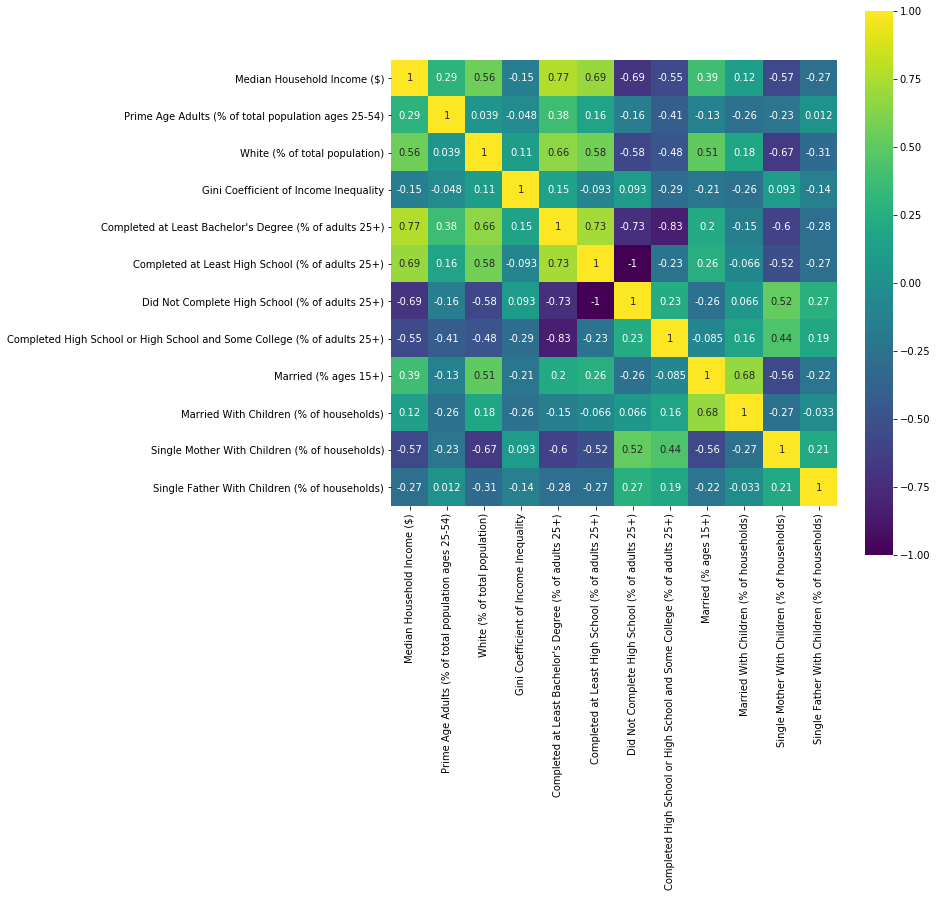

In [274]:
fig = plt.figure(figsize = (10,10))
sns.heatmap(total_corr.corr(),cmap='viridis',annot=True,square=True)

In [280]:
print(total_corr.corr().iloc[:,0].sort_values())

Did Not Complete High School (% of adults 25+)                            -0.690261
Single Mother With Children (% of households)                             -0.566623
Completed High School or High School and Some College (% of adults 25+)   -0.548616
Single Father With Children (% of households)                             -0.274799
Gini Coefficient of Income Inequality                                     -0.149965
Married With Children (% of households)                                    0.116101
Prime Age Adults (% of total population ages 25-54)                        0.294538
Married (% ages 15+)                                                       0.385649
White (% of total population)                                              0.556369
Completed at Least High School (% of adults 25+)                           0.690261
Completed at Least Bachelor's Degree (% of adults 25+)                     0.772423
Median Household Income ($)                                                1

## Analysing Socio-Economic Data

### Reading in Census Data into Dataframes

Wealth

In [42]:
ct_wealth = pd.read_excel('Census Data\Census - Wealth.xlsx',sheet_name='Tract')
cd_wealth = pd.read_excel('Census Data\Census - Wealth.xlsx',sheet_name='CD')

Education

In [43]:
ct_education = pd.read_excel('Census Data\Census - Education.xlsx',sheet_name='Tract')
cd_education = pd.read_excel('Census Data\Census - Education.xlsx',sheet_name='CD')

Demographics

In [44]:
ct_demographics = pd.read_excel('Census Data\Census - Demographics.xlsx',sheet_name='Tract')
cd_demographics = pd.read_excel('Census Data\Census - Demographics.xlsx',sheet_name='CD')

Housing

In [230]:
ct_housing = pd.read_excel('Census Data\Census - Housing.xlsx',sheet_name='Tract')

Public Funding

In [45]:
cd_public_funding = pd.read_excel('Census Data\Census - Public Funding.xlsx',sheet_name='CD')

In [46]:
cd_public_funding.head()

,GEO_ID,GEO_LABEL,GEO_DISPLAY_NAME,After School Programs ($),Fire Department Personnel (#),Immigrant Family Services ($),Library Budget ($),Library Circulation (total # of items),"Library Circulation, Adult (% of all media circulated)","Library Circulation, Children's (% of all media circulated)","Library Circulation, Young Adult (% of all media circulated)",Library Staff (# full-time),Runaway/Homeless Youth Services ($),Sanitation Budget ($),Streets Rated Acceptably Clean (%),Youth Workforce Programs ($)
0,101,Manhattan CD 001,Financial District,1533752.00,188,3.33,1207119,583924,53.498743,40.930840,5.570417,16.00,NaN,4272016,95.4,535750.0
1,102,Manhattan CD 002,Greenwich Village and Soho,1322765.00,163,1.00,3576543,1243675,69.531911,27.174141,3.293947,39.56,369325.0,5872723,96.3,1447437.0
2,103,Manhattan CD 003,Lower East Side and Chinatown,15732794.33,213,215731.00,4072023,1096062,47.154084,45.029478,7.816437,54.50,NaN,7290866,91.0,1324282.0
3,104,Manhattan CD 004,Clinton and Chelsea,2619740.00,101,NaN,1376208,474773,60.129788,34.023839,5.846373,18.50,6073953.0,5299945,95.6,NaN
4,105,Manhattan CD 005,Midtown,886664.00,202,NaN,10569800,2101834,77.669074,19.082240,3.248687,112.82,NaN,4632078,94.4,341270.5


In [47]:
cd_wealth.describe(include='all')

,GEO_ID,GEO_LABEL,GEO_DISPLAY_NAME,Child Poverty (# of children under 18 in households with incomes below poverty),Child Poverty (% of children under 18 in households with incomes below poverty),Commute 60 Minutes Or More One Way (% of workers),Elderly Poverty (# of adults 65 and older),Elderly Poverty (% of adults 65 and older),Employed Full-Time (% of workers),Employed Part-Time (% of workers),Employed Workers with Income Below Poverty Level (%),"Industry Category: Agriculture, Forestry, Fishing, Hunting & Mining (% of all employed)","Industry Category: Arts, Entertainment, Recreation, Accommodation and Food Services (% of all employed)",Industry Category: Construction (% of all employed),"Industry Category: Educational Services, Health Care & Social Assistance (% of all employed)","Industry Category: Finance, Insurance, Real Estate, Rental & Leasing (% of all employed)",Industry Category: Information (% of all employed),Industry Category: Manufacturing (% of all employed),Industry Category: Other Service (% of all employed),"Industry Category: Professional, Scientific, Management, Administrative & Waste Management (% of all employed)",Industry Category: Public Administration (% of all employed),Industry Category: Retail Trade (% of all employed),"Industry Category: Transportation, Warehousing & Utilities (% of all employed)",Industry Category: Wholesale Trade (% of all employed),Labor Force Participation Rate (% working or actively looking for work),"Occupational Category: Management, Business, Science & Arts (% of all employed)","Occupational Category: Natural resources, Construction & Maintenance (% of all employed)","Occupational Category: Production, Transportation & Material Moving (% of all employed)",Occupational Category: Sales & Office (% of all employed),Occupational Category: Service (% of all employed),Poverty (# of individuals in households with incomes below poverty),Poverty (% in households with incomes below poverty),Poverty (% of households with incomes below NYC CEO poverty line),Poverty: 2000 (% in households with incomes below poverty),Poverty: Change Since 2000 (% change in households with incomes below poverty),Private Wage and Salary Workers (% of all employed),Self-employed (% of all employed),TANF and General Assistance (% of households in past 12 months),Unemployed (% ages 16 and older),Unpaid Family Worker (% of all employed),Work for Government (% of all employed)
count,59.000000,59,59,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000
unique,NaN,59,59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Richmond CD 003,Kew Gardens and Woodhaven,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,280.305085,NaN,NaN,8311.779661,26.633802,26.528119,3536.254237,20.540984,79.004574,20.995426,8.808462,0.103373,11.004851,4.910142,26.903960,9.434263,3.701534,3.472040,5.474950,13.237948,3.681410,9.758145,6.197354,2.120031,63.356299,39.467069,6.123469,8.595917,22.099192,23.714353,142745.864407,20.335652,19.935593,22.376220,-5.441193,80.442142,6.311471,4.619858,5.036764,0.133087,13.113300
std,118.769010,NaN,NaN,5802.054416,14.254941,11.362983,1718.025430,10.000045,4.392401,4.392401,4.857581,0.082823,3.721414,2.389868,6.687277,5.498235,2.445368,0.998536,1.467796,5.767378,1.443481,2.002227,2.773952,0.767171,5.876567

In [231]:
ct_wealth['GEO_ID'] = ct_wealth['GEO_ID'].astype('str')
ct_education['GEO_ID'] = ct_education['GEO_ID'].astype('str')
cd_public_funding['GEO_ID'] = cd_public_funding['GEO_ID'].astype('str')
ct_demographics['GEO_ID'] = ct_demographics['GEO_ID'].astype('str')
ct_housing['GEO_ID'] = ct_housing['GEO_ID'].astype('str')

In [49]:
census_tract_mh = ct_wealth[['GEO_ID','Median Household Income ($)']]
census_tract_mh = census_tract_mh.dropna(axis = 0)

### Median Household Income Map

In [295]:
income_map = folium.Map( location=[latitude,longitude], zoom_start = 11)


income_map.choropleth(
    geo_data=census_tracts,
    data=census_tract_mh,
    columns=['GEO_ID','Median Household Income ($)'],
    name='Median Household Income ($)',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Median Household Income ($)',
    
    highlight=True,
    reset=True)

# income_map.choropleth(
#     geo_data=cds,
#     name='Community Districts',
#     fill_color = 'YlOrRd',
#     fill_opacity = 0.01,
#     line_opacity = 1,
#     reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 3,
        'fillOpacity' : 0,
        }
).add_to(income_map )


income_map.save('income.html')
income_map


### Gini Coefficient of Income Inequality Map

In [194]:
gini = ct_wealth[['GEO_ID','Gini Coefficient of Income Inequality']].dropna(axis=0)

gini_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

gini_map.choropleth(
    geo_data=census_tracts,
    data=gini,
    columns=['GEO_ID','Gini Coefficient of Income Inequality'],
    name='Gini Coefficient',
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Gini Coefficient of Income Inequality',
    highlight=True,
    reset=True)

gini_map.choropleth(
    geo_data=cds,
    name='Community Districts',
    fill_color = 'YlOrRd',
    fill_opacity = 0.01,
    line_opacity = 1,
    reset=True)

folium.LayerControl(collapsed=False).add_to(gini_map)

gini_map


### Commute Time Analysis

In [301]:
commute = ct_wealth[['GEO_ID','Commute 60 Minutes Or More One Way (% of workers)']].dropna(axis = 0)
commute_map = folium.Map( location=[latitude,longitude], zoom_start = 11)
commute_map.choropleth(
    geo_data=census_tracts,
    data=commute,
    columns=['GEO_ID','Commute 60 Minutes Or More One Way (% of workers)'],
    name='Percentage of Workers > 60 min one way commute',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Percentage of Workers > 60 min one way commute',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(commute_map )

# folium.LayerControl(collapsed=False).add_to(commute_map)
commute_map.save('commute.html')
commute_map

### Demographics Analysis

#### % White Population

In [196]:
white_pop = ct_demographics[['GEO_ID','White (% of total population)']].dropna(axis = 0)

dem_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

dem_map.choropleth(
    geo_data=census_tracts,
    data=white_pop,
    columns=['GEO_ID','White (% of total population)'],
    name='White (% of total population)',
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='White (% of total population)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(dem_map )

folium.LayerControl(collapsed=False).add_to(dem_map)

dem_map

#### Prime Age Adults (25 - 54 yr old)

In [197]:
prime_age = ct_demographics[['GEO_ID','Prime Age Adults (% of total population ages 25-54)']].dropna(axis=0)

prime_adults_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

prime_adults_map.choropleth(
    geo_data=census_tracts,
    data=prime_age,
    columns=['GEO_ID','Prime Age Adults (% of total population ages 25-54)'],
    name='Prime Age of Adults',
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Percent of Adults in Prime Age Range (25-54 yr old)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(prime_adults_map )

folium.LayerControl(collapsed=False).add_to(prime_adults_map)

prime_adults_map

### Education (% Adults with a Bachelors Degree)

In [297]:
bachelors = ct_education[['GEO_ID','Completed at Least Bachelor\'s Degree (% of adults 25+)']].dropna(axis = 0)

education_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

education_map.choropleth(
    geo_data=census_tracts,
    data=bachelors,
    columns=['GEO_ID','Completed at Least Bachelor\'s Degree (% of adults 25+)'],
    name='% Adults with a Bachelors Degree',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='% Adults with a Bachelors Degree',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(education_map )

# folium.LayerControl(collapsed=False).add_to(education_map)
education_map.save('education.html')
education_map

### Unemployment

In [298]:
unemployment = ct_wealth[['GEO_ID','Unemployed (% ages 16 and older)']].dropna(axis = 0)
unemployment_map = folium.Map( location=[latitude,longitude], zoom_start = 11)
unemployment_map .choropleth(
    geo_data=census_tracts,
    data=unemployment,
    columns=['GEO_ID','Unemployed (% ages 16 and older)'],
    name='Unemployed (% ages 16 and older)',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Unemployed (% ages 16 and older)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(unemployment_map  )

# folium.LayerControl(collapsed=False).add_to(unemployment_map )
unemployment_map.save('unemplyment.html')
unemployment_map 

### Labour Force Participation Rate



In [ ]:
Labor Force Participation Rate (% working or actively looking for work)

In [299]:
labour_participation = ct_wealth[['GEO_ID','Labor Force Participation Rate (% working or actively looking for work)']].dropna(axis = 0)
labour_participation_map = folium.Map( location=[latitude,longitude], zoom_start = 11)
labour_participation_map .choropleth(
    geo_data=census_tracts,
    data=labour_participation,
    columns=['GEO_ID','Labor Force Participation Rate (% working or actively looking for work)'],
    name='Labor Force Participation Rate (% working or actively looking for work)',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Labor Force Participation Rate (% working or actively looking for work)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(labour_participation_map  )

# folium.LayerControl(collapsed=False).add_to(labour_participation_map )
labour_participation_map.save('labor participation.html')
labour_participation_map 

### Poverty

In [300]:
poverty = ct_wealth[['GEO_ID','Poverty (% in households with incomes below poverty)']].dropna(axis = 0)

poverty.loc[poverty.GEO_ID=='36061024000','Poverty (% in households with incomes below poverty)'] =0
poverty.loc[poverty.GEO_ID=='36061014300','Poverty (% in households with incomes below poverty)'] =0
poverty_map = folium.Map( location=[latitude,longitude], zoom_start = 11)
poverty_map .choropleth(
    geo_data=census_tracts,
    data=poverty,
    columns=['GEO_ID','Poverty (% in households with incomes below poverty)'],
    name='Percentage of Workers > 60 min one way commute',
    #nan_fill_color='purple',
    #nan_fill_opacity=0.4,
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Poverty (% in households with incomes below poverty)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(poverty_map  )

# folium.LayerControl(collapsed=False).add_to(poverty_map )
poverty_map.save('poverty.html')
poverty_map

### Housing 

In [236]:
housing = ct_housing[['GEO_ID','Housing Units Occupied by Owners (%)']].dropna(axis=0)

housing_map = folium.Map( location=[latitude,longitude], zoom_start = 11)

housing_map.choropleth(
    geo_data=census_tracts,
    data=housing,
    columns=['GEO_ID','Housing Units Occupied by Owners (%)'],
    name='Prime Age of Adults',
    key_on='feature.properties.tractid',
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name='Housing Units Occupied by Owners (%)',
    
    highlight=True,
    reset=True)

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': '#FFC300' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0,
        }
).add_to(housing_map )

folium.LayerControl(collapsed=False).add_to(housing_map)

housing_map

# Neighbourhoods Analysis

**Foursquare calls**

In [59]:
### Defining Foursquare Credentials and conducting analyses

import requests

CLIENT_ID = 'QMAOL0EJQ0I0TLP4EK50DS4WEX5SUX5I4MDYO00V1GO3JORY'
CLIENT_SECRET= '53CQLIUKBESM4JF52KHHDEVCRKFWDH0Y44YS5MDWRG0ZPLBV'
VERSION = '20180605'
LIMIT=100

In [60]:
# Create the first URL to foursquare using the first postal code coordinates. This will allow us to inspect the returned 
# json file to understand how the data is structured. This will help later to extract the needed data.
radius = 500
limit = 100
n_lat = labels['Latitude'][0]
n_long = labels['Longitude'][0]

url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID,
    CLIENT_SECRET,
    VERSION,
    n_lat,
    n_long,
    radius,
    limit)



#### Initial Foursquare data evaluation

In [61]:
# Get results from foursquare API

results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5eef7a7a14a126001b5c9798'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': '$-$$$$', 'key': 'price'},
    {'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Manhattanville',
  'headerFullLocation': 'Manhattanville, New York',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 39,
  'suggestedBounds': {'ne': {'lat': 40.82254950673066,
    'lng': -73.94909486901895},
   'sw': {'lat': 40.813549497730655, 'lng': -73.96096502420244}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4bd4e5076798ef3b92a6628d',
       'name': 'Chinelos',
       'location': {'address': '530 W 136th St',
        'lat': 40.820190000000004,
        'lng': -73.953769,
        'labeledLatLngs': [{'labe

In [62]:
# Filter results to show venues
venues = results['response']['groups'][0]['items']
venues

[{'reasons': {'count': 0,
   'items': [{'summary': 'This spot is popular',
     'type': 'general',
     'reasonName': 'globalInteractionReason'}]},
  'venue': {'id': '4bd4e5076798ef3b92a6628d',
   'name': 'Chinelos',
   'location': {'address': '530 W 136th St',
    'lat': 40.820190000000004,
    'lng': -73.953769,
    'labeledLatLngs': [{'label': 'display',
      'lat': 40.820190000000004,
      'lng': -73.953769},
     {'label': 'entrance', 'lat': 40.820154, 'lng': -73.953798}],
    'distance': 260,
    'postalCode': '10031',
    'cc': 'US',
    'city': 'New York',
    'state': 'NY',
    'country': 'United States',
    'formattedAddress': ['530 W 136th St',
     'New York, NY 10031',
     'United States']},
   'categories': [{'id': '4bf58dd8d48988d1c1941735',
     'name': 'Mexican Restaurant',
     'pluralName': 'Mexican Restaurants',
     'shortName': 'Mexican',
     'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/mexican_',
      'suffix': '.png'},
     'primary': Tr

In [63]:
# Convert json file into pandas dataframe

explored_venues = json_normalize(venues)
explored_venues.head()

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


,referralId,reasons.count,reasons.items,venue.id,venue.name,venue.location.address,venue.location.lat,venue.location.lng,venue.location.labeledLatLngs,venue.location.distance,venue.location.postalCode,venue.location.cc,venue.location.city,venue.location.state,venue.location.country,venue.location.formattedAddress,venue.categories,venue.delivery.id,venue.delivery.url,venue.delivery.provider.name,venue.delivery.provider.icon.prefix,venue.delivery.provider.icon.sizes,venue.delivery.provider.icon.name,venue.photos.count,venue.photos.groups,venue.location.crossStreet,venue.venuePage.id,venue.location.neighborhood
0,e-0-4bd4e5076798ef3b92a6628d-0,0,"[{'summary': 'This spot is popular', 'type': '...",4bd4e5076798ef3b92a6628d,Chinelos,530 W 136th St,40.820190,-73.953769,"[{'label': 'display', 'lat': 40.82019000000000...",260,10031,US,New York,NY,United States,"[530 W 136th St, New York, NY 10031, United St...","[{'id': '4bf58dd8d48988d1c1941735', 'name': 'M...",306477,https://www.seamless.com/menu/chinelos-ii-530-...,seamless,https://fastly.4sqi.net/img/general/cap/,"[40, 50]",/delivery_provider_seamless_20180129.png,0,[],NaN,NaN,NaN
1,e-0-51573e61e4b06ee00f00307b-1,0,"[{'summary': 'This spot is popular', 'type': '...",51573e61e4b06ee00f00307b,Sushi Sushi,1504 Amsterdam Ave,40.818550,-73.952731,"[{'label': 'entrance', 'lat': 40.818513, 'lng'...",201,10031,US,New York,NY,United States,"[1504 Amsterdam Ave (btwn W 134th & 135th St),...","[{'id': '4bf58dd8d48988d1d2941735', 'name': 'S...",NaN,NaN,NaN,NaN,NaN,NaN,0,[],btwn W 134th & 135th St,NaN,NaN
2,e-0-4b55274bf964a52006dd27e3-2,0,"[{'summary': 'This spot is popular', 'type': '...",4b55274bf964a52006dd27e3,Mofongo del Valle,3340 Broadway,40.820317,-73.954977,"[{'label': 'display', 'lat': 40.82031720001279...",252,10031,US,New York,NY,United States,"[3340 Broadway (W 135th St), New York, NY 1003...","[{'id': '4bf58dd8d48988d150941735', 'name': 'S...",74055,https://www.seamless.com/menu/mofongo-del-vall...,seamless,https://fastly.4sqi.net/img/general/cap/,"[40, 50]",/delivery_provider_seamless_20180129.png,0,[],W 135th St,NaN,NaN
3,e-0-59389a503af98877bbb8dc6a-3,0,"[{'summary': 'This spot is popular', 'type': '...",59389a503af98877bbb8dc6a,Steep Rock West,603 W 129th St,40.816668,-73.957969,"[{'label': 'display', 'lat': 40.81666795087888...",291,10027,US,New York,NY,United States,"[603 W 129th St, New York, NY 10027, United St...","[{'id': '503289d391d4c4b30a586d6a', 'name': 'C...",NaN,NaN,NaN,NaN,NaN,NaN,0,[],NaN,NaN,NaN
4,e-0-5647be78498e1318fd278877-4,0,"[{'summary': 'This spot is popular', 'type': '...",5647be78498e1318fd278877,Bakery HNY,1457 Amsterdam Ave,40.816779,-73.953403,"[{'label': 'display', 'lat': 40.816779, 'lng':...",196,10027,US,New York,NY,United States,"[1457 Amsterdam Ave, New York, NY 10027, Unite...","[{'id': '4bf58dd8d48988d104951735', 'name': 'B...",NaN,NaN,NaN,NaN,NaN,NaN,0,[],NaN,NaN,NaN


In [64]:
### Function from Lab that gets the venues for all the neighborhoods

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Community District', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [65]:
###Get all the data for the Toronto neighborhoods...

community_districts_venues = getNearbyVenues(names=labels['Community District'],
                                   latitudes=labels['Latitude'],
                                   longitudes=labels['Longitude']
                                  )

Morningside Heights and Hamilton Heights
Central Harlem
East Harlem
Washington Heights and Inwood
Financial District
Greenwich Village and Soho
Lower East Side and Chinatown
Clinton and Chelsea
Midtown
Stuyvesant Town and Turtle Bay
Upper West Side
Upper East Side


In [66]:
# Explore the dataframe
community_districts_venues.shape
community_districts_venues.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 968 entries, 0 to 967
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Community District  968 non-null    object 
 1   Latitude            968 non-null    float64
 2   Longitude           968 non-null    float64
 3   Venue               968 non-null    object 
 4   Venue Latitude      968 non-null    float64
 5   Venue Longitude     968 non-null    float64
 6   Venue Category      968 non-null    object 
dtypes: float64(4), object(3)
memory usage: 53.1+ KB


In [109]:
#Save the file as csv
community_districts_venues.to_csv('community_districts_venues.csv')

In [67]:
community_districts_venues.head()

,Community District,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Chinelos,40.820190,-73.953769,Mexican Restaurant
1,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Sushi Sushi,40.818550,-73.952731,Sushi Restaurant
2,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Mofongo del Valle,40.820317,-73.954977,Spanish Restaurant
3,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Steep Rock West,40.816668,-73.957969,Climbing Gym
4,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Bakery HNY,40.816779,-73.953403,Boutique


In [68]:
### How many venues were returned per neighborhood

community_districts_venues.groupby('Community District').count()


,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Community District,,,,,,
Central Harlem,46,46,46,46,46,46
Clinton and Chelsea,84,84,84,84,84,84
East Harlem,65,65,65,65,65,65
Financial District,100,100,100,100,100,100
Greenwich Village and Soho,100,100,100,100,100,100
Lower East Side and Chinatown,100,100,100,100,100,100
Midtown,100,100,100,100,100,100
Morningside Heights and Hamilton Heights,39,39,39,39,39,39
Stuyvesant Town and Turtle Bay,100,100,100,100,100,100


As can be seen above, the 

In [69]:
### How many unique categories

print('There are {} unique venue categories'.format(len(community_districts_venues['Venue Category'].unique())))

There are 206 unique venue categories


In [70]:
community_districts_venues_onehot = pd.get_dummies(community_districts_venues,columns=['Venue Category'],prefix = "", prefix_sep='')

In [71]:
# Size of dataframe
print((community_districts_venues.shape))

(968, 7)


In [72]:
community_districts_venues_onehot.head()

,Community District,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Australian Restaurant,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Trail,Bistro,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Café,Camera Store,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Organic Grocery,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Pub,Public Art,Ramen Restaurant,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shanghai Restaurant,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Tiki Bar,Trail,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Chinelos,40.820190,-73.953769,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Morningside Heights and Hamilton Heights,40.81805,-73.95503,Sushi Sushi,40.818550,-73.952731,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [73]:
cd_onehot = community_districts_venues_onehot.drop(['Latitude', 'Longitude','Venue', 'Venue Latitude', 'Venue Longitude'],axis=1)

In [74]:
cd_onehot.shape

(968, 207)

In [75]:
cds_grouped = cd_onehot.groupby('Community District').mean().reset_index()

In [76]:
cds_grouped.head()

,Community District,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Australian Restaurant,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Trail,Bistro,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Café,Camera Store,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Cheese Shop,Chinese Restaurant,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Cafeteria,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Doctor's Office,Dog Run,Donut Shop,Drugstore,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Organic Grocery,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Pub,Public Art,Ramen Restaurant,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shanghai Restaurant,Shoe Store,Shopping Mall,Smoke Shop,Snack Place,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Taco Place,Tailor Shop,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Tiki Bar,Trail,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Central Harlem,0.065217,0.021739,0.0,0.021739,0.0,0.0,0.0,0.0,0.000000,0.021739,0.000000,0.0,0.065217,0.021739,0.0,0.00,0.000000,0.0,0.00,0.021739,0.021739,0.0,0.00,0.0,0.00,0.000000,0.000000,0.00,0.0,0.021739,0.000000,0.0,0.00,0.000000,0.00,0.043478,0.0,0.000000,0.0,0.021739,0.021739,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.021739,0.00,0.00,0.00,0.00,0.021739,0.0,0.000000,0.000000,0.0,0.021739,0.0,0.0,0.00,0.000000,0.000000,0.0,0.00,0.0,0.0,0.021739,0.00,0.00,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.00,0.043478,0.021739,0.000000,0.00,0.0,0.000000,0.0,0.0,0.00,0.0,0.000000,0.021739,0.043478,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.00,0.00,0.00,0.000000,0.0,0.000000,0.0,0.00,0.043478,0.00,0.0,0.021739,0.0,0.0,0.0,0.000000,0.00,0.021739,0.00,0.0,0.000000,0.021739,0.0,0.0,0.000000,0.00,0.00,0.000000,0.00,0.0,0.0,0.00,0.000000,0.0,0.00,0.000000,0.000000,0.021739,0.00,0.00,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.00000

****Next I checked for the top 5 venues in each Community District****

In [77]:
num_top_venues = 5

for hood in cds_grouped['Community District']:
    print("----"+hood+"----")
    temp = cds_grouped[cds_grouped['Community District'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Central Harlem----
                venue  freq
0  African Restaurant  0.07
1                 Bar  0.07
2    Sushi Restaurant  0.04
3  Seafood Restaurant  0.04
4   French Restaurant  0.04


----Clinton and Chelsea----
                  venue  freq
0                 Hotel  0.13
1          Dance Studio  0.05
2               Theater  0.05
3  Gym / Fitness Center  0.05
4   American Restaurant  0.04


----East Harlem----
                venue  freq
0  Mexican Restaurant  0.08
1              Bakery  0.06
2         Pizza Place  0.06
3  Spanish Restaurant  0.05
4       Deli / Bodega  0.05


----Financial District----
          venue  freq
0   Coffee Shop  0.07
1   Pizza Place  0.05
2         Hotel  0.05
3           Bar  0.05
4  Cocktail Bar  0.04


----Greenwich Village and Soho----
                 venue  freq
0   Italian Restaurant  0.08
1          Pizza Place  0.07
2    Indian Restaurant  0.04
3     Sushi Restaurant  0.04
4  American Restaurant  0.03


----Lower East Side and Chinatown--

In [78]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [79]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Community District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
community_district_sorted = pd.DataFrame(columns=columns)
community_district_sorted['Community District'] = cds_grouped['Community District']

for ind in np.arange(cds_grouped.shape[0]):
    community_district_sorted.iloc[ind, 1:] = return_most_common_venues(cds_grouped.iloc[ind, :], num_top_venues)

community_district_sorted.head()

,Community District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Central Harlem,African Restaurant,Bar,Chinese Restaurant,Sushi Restaurant,French Restaurant,Seafood Restaurant,Jazz Club,Gym / Fitness Center,Coffee Shop,Cosmetics Shop
1,Clinton and Chelsea,Hotel,Gym / Fitness Center,Dance Studio,Theater,Italian Restaurant,American Restaurant,Gym,Coffee Shop,Music Venue,Cocktail Bar
2,East Harlem,Mexican Restaurant,Pizza Place,Bakery,Spanish Restaurant,Deli / Bodega,Park,Burger Joint,Supermarket,Clothing Store,Italian Restaurant
3,Financial District,Coffee Shop,Hotel,Pizza Place,Bar,Park,American Restaurant,Cocktail Bar,Steakhouse,Mexican Restaurant,Event Space
4,Greenwich Village and Soho,Italian Restaurant,Pizza Place,Indian Restaurant,Sushi Restaurant,Ice Cream Shop,American Restaurant,Vegetarian / Vegan Restaurant,Sandwich Place,Café,Mediterranean Restaurant


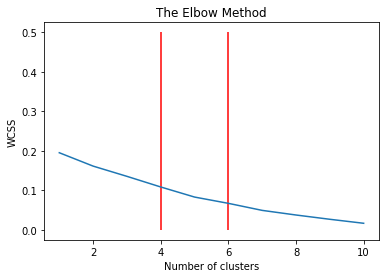

In [81]:
from sklearn.cluster import KMeans
wcss = []
cds_grouped_clustering = cds_grouped.drop('Community District', 1)
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(cds_grouped_clustering)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.vlines(6,ymin=0,ymax=0.5,color='red')
plt.vlines(4,ymin=0,ymax=0.5,color='red')
plt.show()



In [281]:
from sklearn.cluster import KMeans
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cds_grouped_clustering )

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([4, 0, 1, 0, 1, 1, 0, 3, 1, 1])

#### Clustered Postal Codes clusters are added back into the main dataframe below.

In [283]:
# add clustering labels
#community_district_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
community_district_sorted['Cluster Labels']= kmeans.labels_
labels_merged = labels

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
labels_merged = labels_merged.join(community_district_sorted.set_index('Community District'), on='Community District')

labels_merged.head() # check the last columns!

,Community District,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Morningside Heights and Hamilton Heights,40.818050,-73.955030,3,Coffee Shop,Supermarket,Chinese Restaurant,Mexican Restaurant,Seafood Restaurant,Spanish Restaurant,Juice Bar,Food & Drink Shop,Latin American Restaurant,Café
1,Central Harlem,40.813688,-73.944736,4,African Restaurant,Bar,Chinese Restaurant,Sushi Restaurant,French Restaurant,Seafood Restaurant,Jazz Club,Gym / Fitness Center,Coffee Shop,Cosmetics Shop
2,East Harlem,40.794899,-73.934971,1,Mexican Restaurant,Pizza Place,Bakery,Spanish Restaurant,Deli / Bodega,Park,Burger Joint,Supermarket,Clothing Store,Italian Restaurant
3,Washington Heights and Inwood,40.855112,-73.931525,2,Pizza Place,Mexican Restaurant,Bar,Latin American Restaurant,Grocery Store,Seafood Restaurant,Donut Shop,Chinese Restaurant,Spa,Spanish Restaurant
4,Financial District,40.707287,-74.012106,0,Coffee Shop,Hotel,Pizza Place,Bar,Park,American Restaurant,Cocktail Bar,Steakhouse,Mexican Restaurant,Event Space


### Final mapping of the various clusters. 


In [310]:
import matplotlib.cm as cm
import matplotlib.colors as colors
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

folium.GeoJson(
    cds,
    name='geojson',
        style_function=lambda feature: {
        'fillColor': 'green' ,
        'color' : '#000000' ,
        'weight' : 2,
        'fillOpacity' : 0.3,
        }
).add_to(map_clusters)

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(labels_merged['Latitude'], labels_merged['Longitude'], labels_merged['Community District'], labels_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
map_clusters.save('clusters.html')       




map_clusters


# Cluster Analysis

## Cluster 0

In [285]:
cluster0 = labels_merged.loc[labels_merged['Cluster Labels'] == 0, labels_merged.columns[[0] + list(range(4, labels_merged.shape[1]))]]

Text(0.5, 1.0, '3rd Most Common Venue')

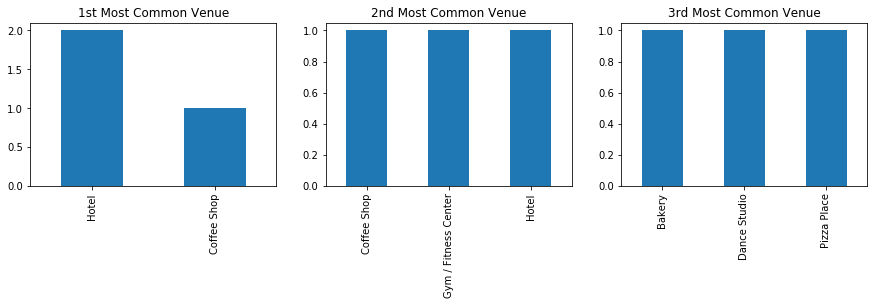

In [286]:
%matplotlib inline

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
cluster0['1st Most Common Venue'].value_counts().plot(kind='bar',ax=ax1)
cluster0['2nd Most Common Venue'].value_counts().plot(kind='bar',ax=ax2)
cluster0['3rd Most Common Venue'].value_counts().plot(kind='bar',ax=ax3)
ax1.set_title('1st Most Common Venue')
ax2.set_title('2nd Most Common Venue')
ax3.set_title('3rd Most Common Venue')

## Cluster 1


In [287]:
cluster1 = labels_merged.loc[labels_merged['Cluster Labels'] == 1, labels_merged.columns[[0] + list(range(4, labels_merged.shape[1]))]]

Text(0.5, 1.0, '3rd Most Common Venue')

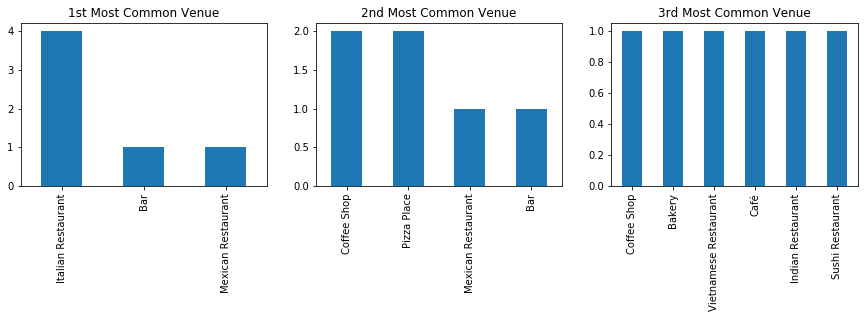

In [288]:
%matplotlib inline

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
cluster1['1st Most Common Venue'].value_counts().plot(kind='bar',ax=ax1)
cluster1['2nd Most Common Venue'].value_counts().plot(kind='bar',ax=ax2)
cluster1['3rd Most Common Venue'].value_counts().plot(kind='bar',ax=ax3)
ax1.set_title('1st Most Common Venue')
ax2.set_title('2nd Most Common Venue')
ax3.set_title('3rd Most Common Venue')

## Cluster 2


In [289]:
cluster2 = labels_merged.loc[labels_merged['Cluster Labels'] == 2, labels_merged.columns[[0] + list(range(4, labels_merged.shape[1]))]]

Text(0.5, 1.0, '3rd Most Common Venue')

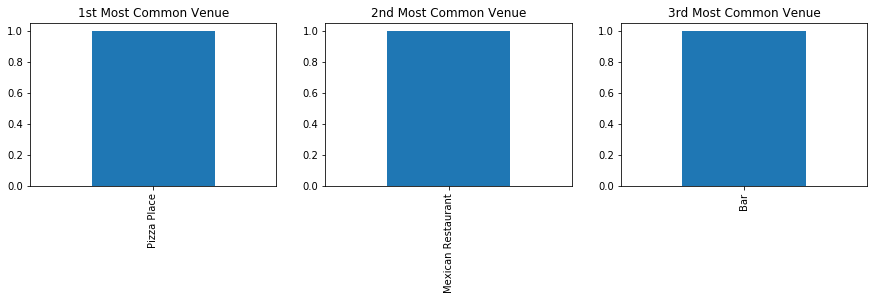

In [290]:
%matplotlib inline

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
cluster2['1st Most Common Venue'].value_counts().plot(kind='bar',ax=ax1)
cluster2['2nd Most Common Venue'].value_counts().plot(kind='bar',ax=ax2)
cluster2['3rd Most Common Venue'].value_counts().plot(kind='bar',ax=ax3)
ax1.set_title('1st Most Common Venue')
ax2.set_title('2nd Most Common Venue')
ax3.set_title('3rd Most Common Venue')

## Cluster 3


In [291]:
cluster3 = labels_merged.loc[labels_merged['Cluster Labels'] == 3, labels_merged.columns[[0] + list(range(4, labels_merged.shape[1]))]]

Text(0.5, 1.0, '3rd Most Common Venue')

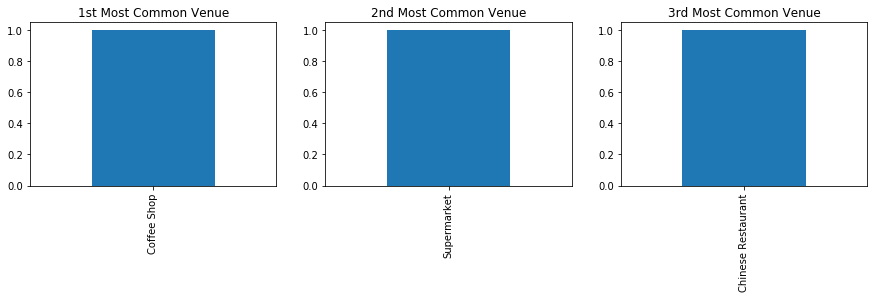

In [292]:
%matplotlib inline

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
cluster3['1st Most Common Venue'].value_counts().plot(kind='bar',ax=ax1)
cluster3['2nd Most Common Venue'].value_counts().plot(kind='bar',ax=ax2)
cluster3['3rd Most Common Venue'].value_counts().plot(kind='bar',ax=ax3)
ax1.set_title('1st Most Common Venue')
ax2.set_title('2nd Most Common Venue')
ax3.set_title('3rd Most Common Venue')

## Cluster 4


In [293]:
cluster4 = labels_merged.loc[labels_merged['Cluster Labels'] == 4, labels_merged.columns[[0] + list(range(4, labels_merged.shape[1]))]]

Text(0.5, 1.0, '3rd Most Common Venue')

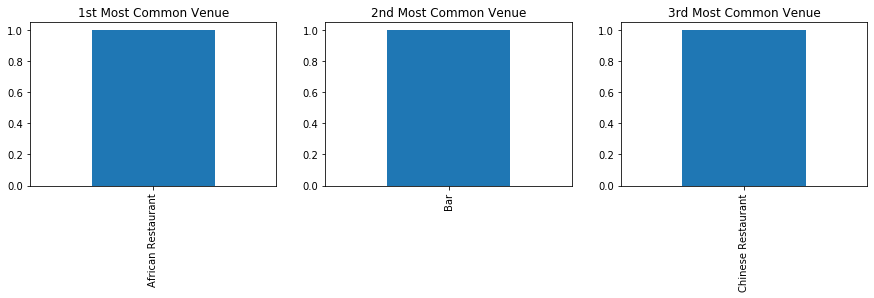

In [294]:
%matplotlib inline

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
cluster4['1st Most Common Venue'].value_counts().plot(kind='bar',ax=ax1)
cluster4['2nd Most Common Venue'].value_counts().plot(kind='bar',ax=ax2)
cluster4['3rd Most Common Venue'].value_counts().plot(kind='bar',ax=ax3)
ax1.set_title('1st Most Common Venue')
ax2.set_title('2nd Most Common Venue')
ax3.set_title('3rd Most Common Venue')